# Quran OCR (For Page 1-2 Only)

The Quran image data used in this notebook were downloaded from http://quran.ksu.edu.sa/ayat/images.ayt. It is actually an archive file that can be easily extracted.

## Manual Metadata Extraction

The code below was taken from https://www.sicara.ai/blog/object-detection-template-matching

In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt


DEFAULT_TEMPLATE_MATCHING_THRESHOLD = 0.5
NMS_THRESHOLD = 0.2


class Template:
    """
    A class defining a template
    """
    def __init__(self, image_path, label, color, matching_threshold=DEFAULT_TEMPLATE_MATCHING_THRESHOLD):
        """
        Args:
            image_path (str): path of the template image path
            label (str): the label corresponding to the template
            color (List[int]): the color associated with the label (to plot detections)
            matching_threshold (float): the minimum similarity score to consider an object is detected by template
                matching
        """
        self.image_path = image_path
        self.label = label
        self.color = color
        self.template = cv2.imread(image_path)
        self.template_height, self.template_width = self.template.shape[:2]
        self.matching_threshold = matching_threshold


def compute_iou(a, b, epsilon=1e-5):
    """ Given two boxes `a` and `b` defined as a list of four numbers:
            [x1,y1,x2,y2]
        where:
            x1,y1 represent the upper left corner
            x2,y2 represent the lower right corner
        It returns the Intersect of Union score for these two boxes.

    Args:
        a:          (list of 4 numbers) [x1,y1,x2,y2]
        b:          (list of 4 numbers) [x1,y1,x2,y2]
        epsilon:    (float) Small value to prevent division by zero

    Returns:
        (float) The Intersect of Union score.
    """
    # COORDINATES OF THE INTERSECTION BOX
    x1 = max(a[0], b[0])
    y1 = max(a[1], b[1])
    x2 = min(a[2], b[2])
    y2 = min(a[3], b[3])

    # AREA OF OVERLAP - Area where the boxes intersect
    width = (x2 - x1)
    height = (y2 - y1)
    # handle case where there is NO overlap
    if (width < 0) or (height < 0):
        return 0.0
    area_overlap = width * height

    # COMBINED AREA
    area_a = (a[2] - a[0]) * (a[3] - a[1])
    area_b = (b[2] - b[0]) * (b[3] - b[1])
    area_combined = area_a + area_b - area_overlap

    # RATIO OF AREA OF OVERLAP OVER COMBINED AREA
    iou = area_overlap / (area_combined + epsilon)
    return iou


def non_max_suppression(
    objects,
    non_max_suppression_threshold=0.5,
    score_key="MATCH_VALUE",
):
    """
    Filter objects overlapping with IoU over threshold by keeping only the one with maximum score.
    Args:
        objects (List[dict]): a list of objects dictionaries, with:
            {score_key} (float): the object score
            {top_left_x} (float): the top-left x-axis coordinate of the object bounding box
            {top_left_y} (float): the top-left y-axis coordinate of the object bounding box
            {bottom_right_x} (float): the bottom-right x-axis coordinate of the object bounding box
            {bottom_right_y} (float): the bottom-right y-axis coordinate of the object bounding box
        non_max_suppression_threshold (float): the minimum IoU value used to filter overlapping boxes when
            conducting non max suppression.
        score_key (str): score key in objects dicts
    Returns:
        List[dict]: the filtered list of dictionaries.
    """
    sorted_objects = sorted(objects, key=lambda obj: obj[score_key], reverse=True)
    filtered_objects = []
    for object_ in sorted_objects:
        overlap_found = False
        for filtered_object in filtered_objects:
            a = [
                object_['TOP_LEFT_X'],
                object_['TOP_LEFT_Y'],
                object_['BOTTOM_RIGHT_X'],
                object_['BOTTOM_RIGHT_Y'],
            ]
            b = [
                filtered_object['TOP_LEFT_X'],
                filtered_object['TOP_LEFT_Y'],
                filtered_object['BOTTOM_RIGHT_X'],
                filtered_object['BOTTOM_RIGHT_Y'],
            ]
            iou = compute_iou(a, b)
            if iou > non_max_suppression_threshold:
                overlap_found = True
                break
        if not overlap_found:
            filtered_objects.append(object_)
    return filtered_objects


def detect(image, templates):
    detections = []
    for template in templates:
        template_matching = cv2.matchTemplate(
            template.template, image, cv2.TM_CCOEFF_NORMED
        )

        match_locations = np.where(template_matching >= template.matching_threshold)

        for (x, y) in zip(match_locations[1], match_locations[0]):
            match = {
                "TOP_LEFT_X": x,
                "TOP_LEFT_Y": y,
                "BOTTOM_RIGHT_X": x + template.template_width,
                "BOTTOM_RIGHT_Y": y + template.template_height,
                "MATCH_VALUE": template_matching[y, x],
                "LABEL": template.label,
                "COLOR": template.color
            }
            detections.append(match)

    detections = non_max_suppression(detections, non_max_suppression_threshold=NMS_THRESHOLD)

    # image_with_detections = image.copy()
    # for detection in detections:
    #     cv2.rectangle(
    #         image_with_detections,
    #         (detection["TOP_LEFT_X"], detection["TOP_LEFT_Y"]),
    #         (detection["BOTTOM_RIGHT_X"], detection["BOTTOM_RIGHT_Y"]),
    #         detection["COLOR"],
    #         1,
    #     )
    #     cv2.putText(
    #         image_with_detections,
    #         f"{detection['LABEL']} - {detection['MATCH_VALUE']}",
    #         (detection["TOP_LEFT_X"] + 2, detection["TOP_LEFT_Y"] + 20),
    #         cv2.FONT_HERSHEY_SIMPLEX,
    #         0.5,
    #         detection["COLOR"],
    #         1,
    #         cv2.LINE_AA,
    #     )

    # cv2.imshow('Result', image_with_detections)
    # cv2.waitKey(0)

    return detections

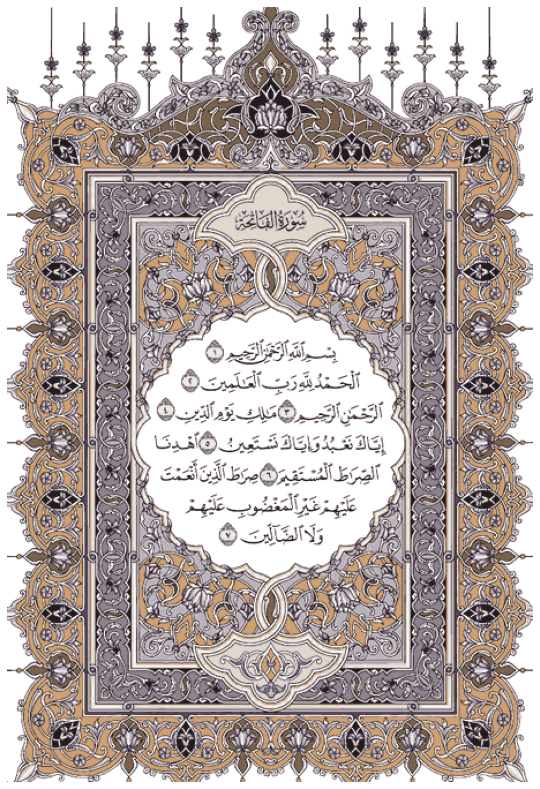

In [2]:
import matplotlib
from os import path


# constants
DPI_DISPLAY = 96
PAGE_BORDER = 42

IMAGE_DIR = './dataset/quran-images/'
AYAH_MARKER_SM_FILENAME = 'aya-end-marker-sm.png'  # usually for page 1-2

# TODO: validate with other variants
image = cv2.imread(path.join(IMAGE_DIR, '1.png'))
PAGE_HEIGHT, PAGE_WIDTH, _ = image.shape

# matplotlib display settings
rc = {'figure.figsize': (PAGE_HEIGHT/(DPI_DISPLAY/3), PAGE_WIDTH/(DPI_DISPLAY/3)),
      'axes.spines.left': False,
      'axes.spines.right': False,
      'axes.spines.bottom': False,
      'axes.spines.top': False,
      'xtick.bottom': False,
      'xtick.labelbottom': False,
      'ytick.labelleft': False,
      'ytick.left': False}
plt.rcParams.update(rc)

# for validation purposes only
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)
plt.show()

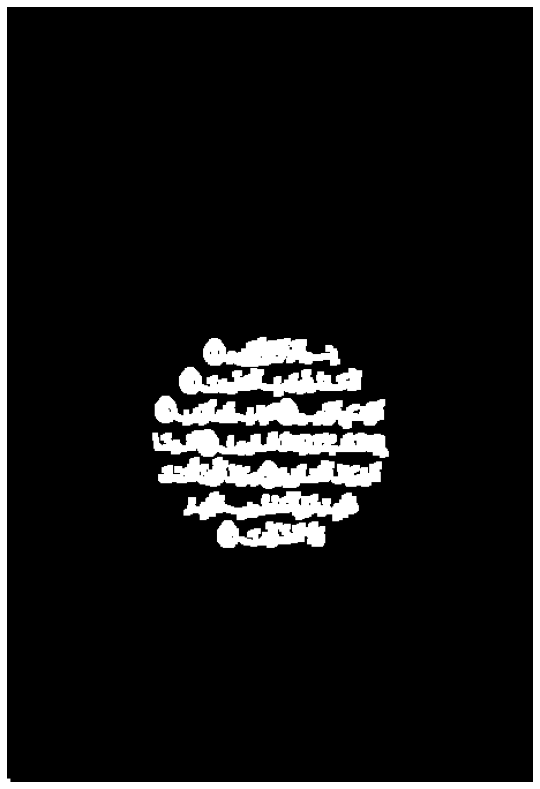

In [3]:
# Remove page border
# for page 1-2 only
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
image_thresh = cv2.threshold(image_gray, 1, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

kernel_dilation = np.ones((5, 5), np.uint8)
image_dilation = cv2.dilate(image_thresh, kernel_dilation, iterations=1)

# plt.imshow(image_dilation)
# plt.show()

for scale in [0.10, 0.125, 0.15]:  # sliding window
    cv2.floodFill(image_dilation, None, (int(PAGE_HEIGHT * scale), int(PAGE_WIDTH / 2)), 0)

# plt.imshow(image_dilation)
# plt.show()

image_wo_border = cv2.cvtColor(image_dilation, cv2.COLOR_GRAY2RGB)

plt.imshow(image_wo_border)
plt.show()

In [4]:
# Find ayah's end marker glyph
templates = [Template(image_path=path.join(IMAGE_DIR, AYAH_MARKER_SM_FILENAME), label="ayah-sm", color=(255, 0, 255)),]
bbox_ids = detect(image, templates)

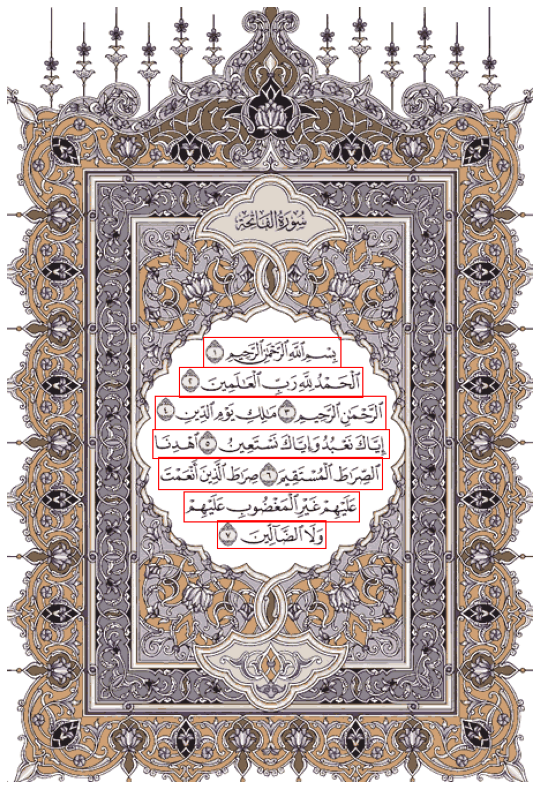

In [5]:
# Line segmentation
bbox_lines = cv2.findContours(image_dilation, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
bbox_lines = bbox_lines[0] if len(bbox_lines) == 2 else bbox_lines[1]

image_with_contours = image_rgb.copy()
bbox_lines_ = []
for bbox in bbox_lines:
    x, y, w, h = cv2.boundingRect(bbox)
    if h < (PAGE_HEIGHT * 0.025):
        continue
    match = {
        "TOP_LEFT_X": x,
        "TOP_LEFT_Y": y,
        "BOTTOM_RIGHT_X": x + w,
        "BOTTOM_RIGHT_Y": y + h,
        "LABEL": "line",
        "COLOR": (0, 255, 255)
    }
    bbox_lines_.append(match)
    cv2.rectangle(image_with_contours, (x, y), (x+w, y+h), (255, 0, 0), 1)

plt.imshow(image_with_contours)
plt.show()

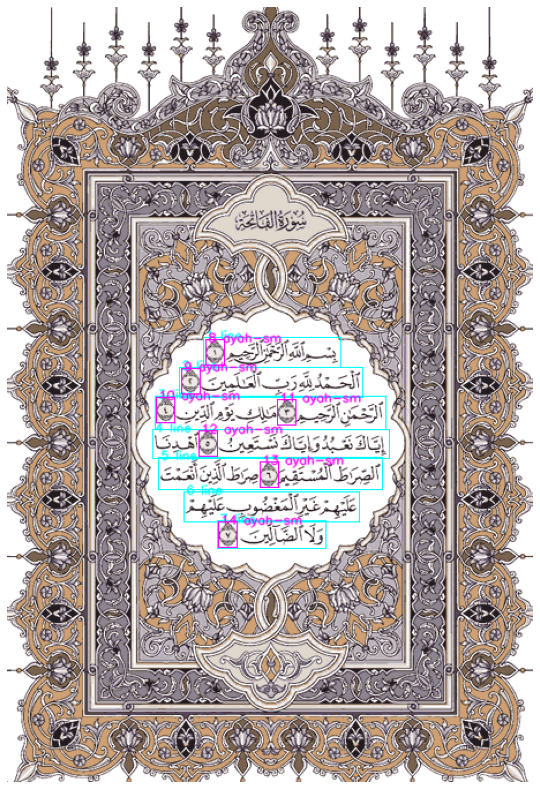

In [6]:
# Gather all bboxes
bbox_lines_.sort(key=lambda x: x["TOP_LEFT_Y"])

bbox_ayah = [bbox for bbox in bbox_ids if bbox["LABEL"] == "ayah-sm"]
bbox_ayah.sort(key=lambda x: (x["TOP_LEFT_Y"], x["TOP_LEFT_X"]))

bbox_all = bbox_lines_ + bbox_ayah

image_before_norm = image_rgb.copy()
for idx, bbox in enumerate(bbox_all):
    cv2.rectangle(
        image_before_norm,
        (bbox["TOP_LEFT_X"], bbox["TOP_LEFT_Y"]),
        (bbox["BOTTOM_RIGHT_X"], bbox["BOTTOM_RIGHT_Y"]),
        bbox["COLOR"],
        1,
    )
    cv2.putText(
        image_before_norm,
        f"{idx + 1} {bbox['LABEL']}",
        (bbox["TOP_LEFT_X"] + 2, bbox["TOP_LEFT_Y"] + 2),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.35,
        bbox["COLOR"],
        1,
        cv2.LINE_AA,
    )

plt.imshow(image_before_norm)
plt.show()

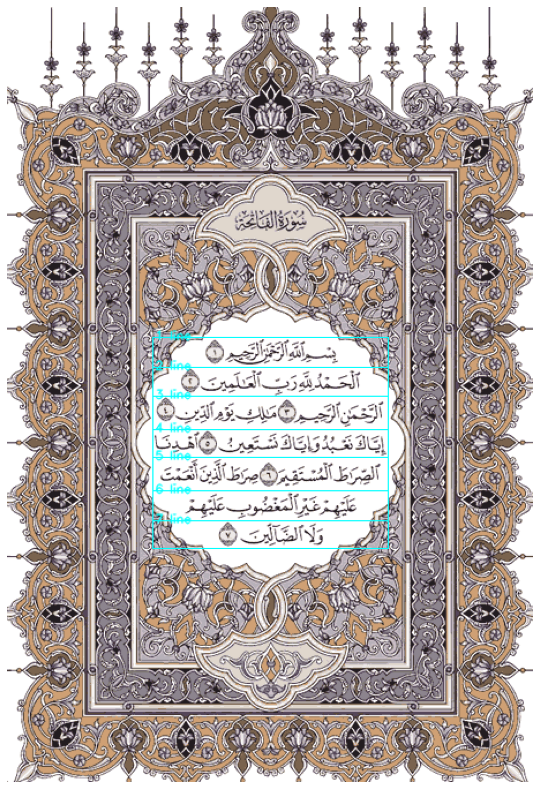

In [7]:
BBOX_MIN_X = min([bbox["TOP_LEFT_X"] for bbox in bbox_all])

# Normalise
# to remove gap between bbox lines
bbox_all_lines_norm = bbox_lines_.copy()
for idx_line, bbox in enumerate(bbox_all_lines_norm):
    try:
        y_center = int((bbox["BOTTOM_RIGHT_Y"] + bbox_all_lines_norm[idx_line + 1]["TOP_LEFT_Y"]) / 2)
        bbox_all_lines_norm[idx_line]["BOTTOM_RIGHT_Y"] = bbox_all_lines_norm[idx_line + 1]["TOP_LEFT_Y"] = y_center
    except:
        break

# to uniform bbox line lengths
for idx, _ in enumerate(bbox_all_lines_norm):
    bbox_all_lines_norm[idx]["TOP_LEFT_X"] = BBOX_MIN_X
    bbox_all_lines_norm[idx]["BOTTOM_RIGHT_X"] = PAGE_WIDTH - BBOX_MIN_X

image_after_norm = image_rgb.copy()
for idx, bbox in enumerate(bbox_all_lines_norm):
    cv2.rectangle(
        image_after_norm,
        (bbox["TOP_LEFT_X"], bbox["TOP_LEFT_Y"]),
        (bbox["BOTTOM_RIGHT_X"], bbox["BOTTOM_RIGHT_Y"]),
        bbox["COLOR"],
        1,
    )
    cv2.putText(
        image_after_norm,
        f"{idx + 1} {bbox['LABEL']}",
        (bbox["TOP_LEFT_X"] + 2, bbox["TOP_LEFT_Y"] + 2),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.35,
        bbox["COLOR"],
        1,
        cv2.LINE_AA,
    )

plt.imshow(image_after_norm)
plt.show()

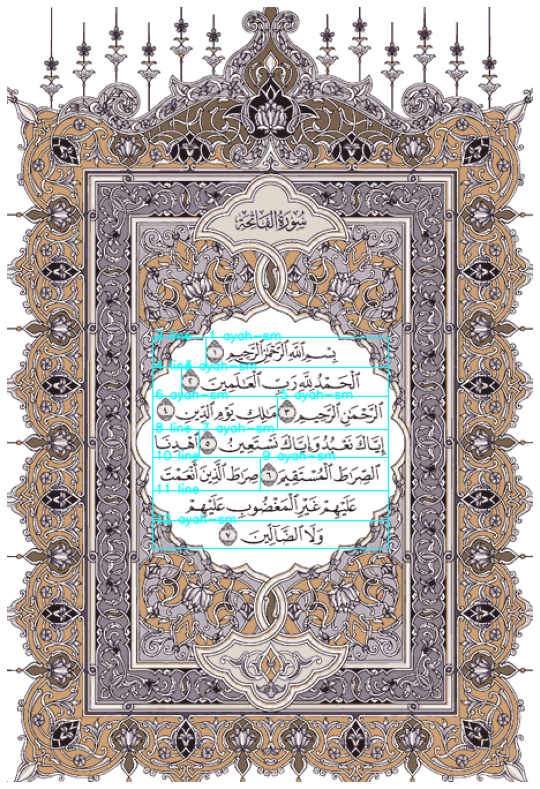

In [15]:
AYAH_MARGIN_TOLERANCE = (bbox_ayah[0]['BOTTOM_RIGHT_X'] - bbox_ayah[0]['TOP_LEFT_X']) / 3

# Ayah segmentation
bboxes = []
idx_ayah = 0

for idx_line, bbox_line in enumerate(bbox_all_lines_norm):
    if bbox_line['LABEL'] != 'line':
        bboxes.append(bbox_line)
        continue

    def get_y_center(bbox):
        return bbox['TOP_LEFT_Y'] + (bbox['BOTTOM_RIGHT_Y'] - bbox['TOP_LEFT_Y']) / 2

    bbox_ayah_ = []
    y_center = get_y_center(bbox_ayah[idx_ayah])
    while bbox_line['TOP_LEFT_Y'] < y_center < bbox_line['BOTTOM_RIGHT_Y']:
        bbox_ayah_.append(bbox_ayah[idx_ayah])
        idx_ayah += 1
        try:
            y_center = get_y_center(bbox_ayah[idx_ayah])
        except:
            break

    if len(bbox_ayah_) > 0:
        margin_right = bbox_line['BOTTOM_RIGHT_X']
        for idx_ayah_, bbox in enumerate(reversed(bbox_ayah_)):
            bbox_line_ = bbox_line.copy()
            bbox_line_['TOP_LEFT_X'] = bbox['TOP_LEFT_X']
            try:  # special case
                if (idx_line + 1) == len(bbox_all_lines_norm) or \
                        bbox_all_lines_norm[idx_line + 1]['LABEL'] != 'line'  or \
                        bbox['TOP_LEFT_X'] < BBOX_MIN_X+AYAH_MARGIN_TOLERANCE:
                    bbox_line_['TOP_LEFT_X'] = bbox_line['TOP_LEFT_X']
            except:
                ...
            bbox_line_['BOTTOM_RIGHT_X'] = margin_right
            bbox_line_['LABEL'] = bbox['LABEL']
            bboxes.append(bbox_line_)
            margin_right = bbox_line_['TOP_LEFT_X']

        if bbox_line_['TOP_LEFT_X'] > BBOX_MIN_X:
            bbox_line__ = bbox_line.copy()
            bbox_line__['BOTTOM_RIGHT_X'] = bbox_line_['TOP_LEFT_X']
            bboxes.append(bbox_line__)
    else:
        bboxes.append(bbox_line)

image_ayah_segmented = image_rgb.copy()
for idx, bbox in enumerate(bboxes):
    cv2.rectangle(
        image_ayah_segmented,
        (bbox["TOP_LEFT_X"], bbox["TOP_LEFT_Y"]),
        (bbox["BOTTOM_RIGHT_X"], bbox["BOTTOM_RIGHT_Y"]),
        bbox["COLOR"],
        1,
    )
    cv2.putText(
        image_ayah_segmented,
        f"{idx + 1} {bbox['LABEL']}",
        (bbox["TOP_LEFT_X"] + 2, bbox["TOP_LEFT_Y"] + 2),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.35,
        bbox["COLOR"],
        1,
        cv2.LINE_AA,
    )

plt.imshow(image_ayah_segmented)
plt.show()